In [1]:
import Pkg; Pkg.add("StatsBase");Pkg.add("CurveFit");
using DifferentialEquations
using Plots
using StatsBase
using LinearAlgebra
using CurveFit

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.9/Project.toml`
  No Changes to `~/.julia/environments/v1.9/Manifest.toml`
   Resolving package versions...
   Installed CurveFit ──── v0.6.0
   Installed Polynomials ─ v4.0.5
    Updating `~/.julia/environments/v1.9/Project.toml`
  [5a033b19] + CurveFit v0.6.0
    Updating `~/.julia/environments/v1.9/Manifest.toml`
  [5a033b19] + CurveFit v0.6.0
  [f27b6e38] + Polynomials v4.0.5
Precompiling project...
  ✓ Polynomials
  ✓ CurveFit
  2 dependencies successfully precompiled in 15 seconds. 317 already precompiled.


In [80]:
function f(u,p,t)
    # r1 = u1, r2 = u2, s11=u3, s12=u4 s21=u5, s22=u6
    return [
        u[3]*u[1] + u[4]*u[2] - PHI * u[1]
        u[5]*u[1] + u[6]*u[2] - PHI * u[2]
        - u[3]
        - u[4]
        - u[5]
        - u[6]
    ]
end


function g(u,p,t)
    [
        sqrt(kappa) 0 0 0 0
        0 sqrt(kappa) 0 0 0
        0 0 sqrt(D) 0 0 
        0 0 0 sqrt(D) sqrt(2)*sqrt(D)
        0 0 0 sqrt(D) -sqrt(2)*sqrt(D)
        0 0 -sqrt(D) 0 0
    ]
end

g (generic function with 1 method)

In [92]:
kappa = 0.001
D = 0.01
PHI=0.02
rd = sqrt(kappa/D)

0.31622776601683794

In [105]:
u0 = zeros(6)
tspan = (0.0, 50000.0)
prob = SDEProblem(f, g, u0, tspan, noise_rate_prototype = zeros(6, 5))
res = solve(prob)

retcode: Success
Interpolation: 1st order linear
t: 167334-element Vector{Float64}:
     0.0
     3.1878835653166837e-10
     6.774252576297953e-10
     1.0808917713651882e-9
     1.5347915993175052e-9
     2.045428905763862e-9
     2.6198958755160134e-9
     3.2661712164871837e-9
     3.99323097507975e-9
     4.811173203496388e-9
     5.7313582104651055e-9
     6.766566343304912e-9
     7.931175492749694e-9
     ⋮
 49996.397968709956
 49996.75914464448
 49997.16546757082
 49997.45067918327
 49997.771542247276
 49998.13251319428
 49998.3989752969
 49998.69874516235
 49999.00052113862
 49999.34001911193
 49999.7219543319
 50000.0
u: 167334-element Vector{Vector{Float64}}:
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [-3.2933864812042175e-7, -5.524685245448598e-8, 1.8045855622134269e-6, -2.5359409762719833e-6, -1.244483347205916e-6, -1.8045855622134269e-6]
 [2.499707313981191e-7, 4.938950555305797e-7, 2.0163194233025533e-6, 2.2247759045659435e-6, -6.3105139531689865e-6, -2.0163194233025533e-6]
 [-1.

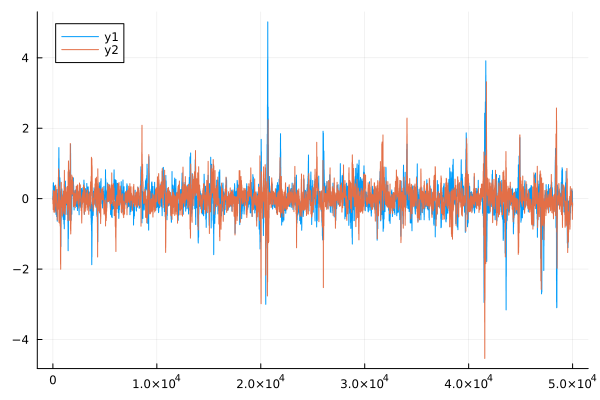

In [106]:
u = reduce(hcat, res.u)
plot(res.t, u[2,:])
plot!(res.t, u[1,:])

In [107]:
i = 200
sigma =  [u[3,i] u[4,i]; u[5,i] u[6,i]]
eigen(sigma)


Eigen{ComplexF64, ComplexF64, Matrix{ComplexF64}, Vector{ComplexF64}}
values:
2-element Vector{ComplexF64}:
 1.3877787807814457e-17 - 0.15690011293131106im
 1.3877787807814457e-17 + 0.15690011293131106im
vectors:
2×2 Matrix{ComplexF64}:
  0.784068-0.0im      0.784068+0.0im
 -0.251359+0.5675im  -0.251359-0.5675im

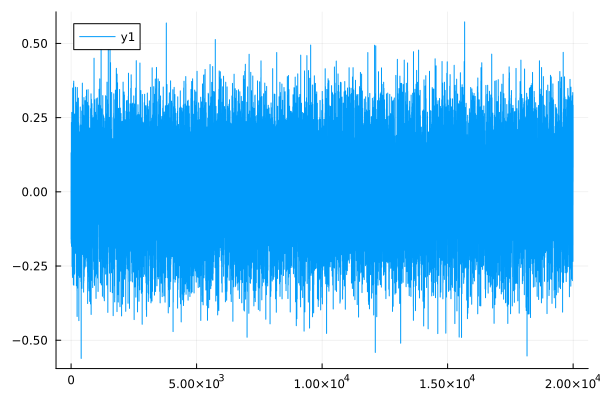

In [86]:
plot(res.t, u[4,:])

In [108]:
seperations = sum(x -> x^2, u[1:2,:]; dims=1)
seperations .= sqrt.(seperations)

1×167334 Matrix{Float64}:
 0.0  3.3394e-7  5.5355e-7  1.02537e-6  …  0.209236  0.23767  0.24675

Below is the observed stationary distribution. Need to figure out how to do the fitting in Julia that I did in python but it appears clear that it is not following a power law. Additionally the r_d for the above chosen parameters is 10. Which also does not match observation.

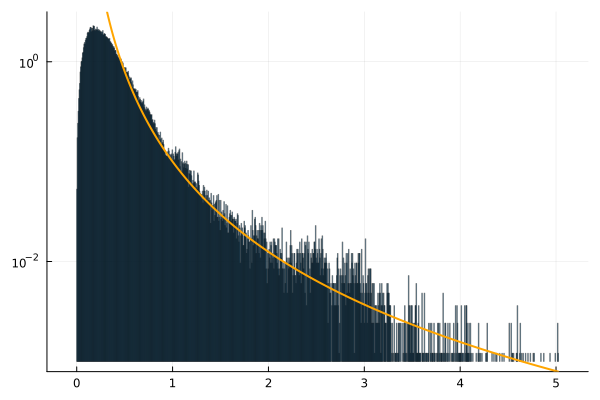

In [109]:
# only plot from 10000 so we don't consider data from the begining of the episode
#hist=histogram(transpose(seperations)[10000:end],bins=2000,normalize=:pdf,yscale=:log10)

# Generate the reference curve data
r_values = range(rd, stop = maximum(transpose(seperations)), length = 1000)
pst(r) = (rd/r)^(2(PHI-D)/D)/r
pst_values = pst.(r_values)

# Create a histogram
histogram_data = transpose(seperations)[1000:end]
hist = histogram(histogram_data, bins = 2000, normalize = :pdf, yscale = :log10, legend = false, alpha = 0.5)

# Overlay the reference curve in solid orange
plot!(r_values, pst_values, color = :orange, linewidth = 2)

# Show the plot
display(hist)